<a href="https://colab.research.google.com/github/anjelica0224/LicensePlate-detection/blob/main/GroundedDINO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd GroundingDINO
!git checkout -q 57535c5a79791cb76e36fdb64975271354f10251
!pip install -q -e .

Cloning into 'GroundingDINO'...
remote: Enumerating objects: 446, done.
remote: Counting objects: 100% (214/214), done.
remote: Compressing objects: 100% (86/86), done.
remote: Total 446 (delta 158), reused 137 (delta 128), pack-reused 232
Receiving objects: 100% (446/446), 12.87 MiB | 15.55 MiB/s, done.
Resolving deltas: 100% (230/230), done.
/content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 48.4 MB/s eta 0:00:00


In [ ]:
!pip uninstall -y supervision
!pip install -q supervision==0.6.0

import supervision as svn
print(svn.__version__)

Found existing installation: supervision 0.4.0
Uninstalling supervision-0.4.0:
  Successfully uninstalled supervision-0.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
groundingdino 0.1.0 requires supervision==0.4.0, but you have supervision 0.6.0 which is incompatible.
0.6.0


In [ ]:
import os

GROUNDING_DINO_CONFIG_PATH = os.path.join("groundingdino/config/GroundingDINO_SwinT_OGC.py")
print(GROUNDING_DINO_CONFIG_PATH, "; exist:", os.path.isfile(GROUNDING_DINO_CONFIG_PATH))
!mkdir -p weights
%cd weights

!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth
import os
%cd /content/GroundingDINO
GROUNDING_DINO_CHECKPOINT_PATH = os.path.join("weights/groundingdino_swint_ogc.pth")
print(GROUNDING_DINO_CHECKPOINT_PATH, "; exist:", os.path.isfile(GROUNDING_DINO_CHECKPOINT_PATH))

groundingdino/config/GroundingDINO_SwinT_OGC.py ; exist: True
/content/GroundingDINO/weights
/content/GroundingDINO
weights/groundingdino_swint_ogc.pth ; exist: True


In [ ]:
import torch

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
from groundingdino.util.inference import Model

grounding_dino_model = Model(model_config_path=GROUNDING_DINO_CONFIG_PATH, model_checkpoint_path=GROUNDING_DINO_CHECKPOINT_PATH)

/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

In [ ]:
!mkdir -p data


In [ ]:
!pwd

/content/GroundingDINO


In [ ]:
!cp /content/drive/MyDrive/frames310 /content/GroundingDINO

cp: -r not specified; omitting directory '/content/drive/MyDrive/frames310'


In [ ]:
SOURCE_IMAGE_PATH = "/content/GroundingDINO/data/frame_0.jpg"
CLASSES = ['license plate'] #add the class name to be labeled automatically
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.15

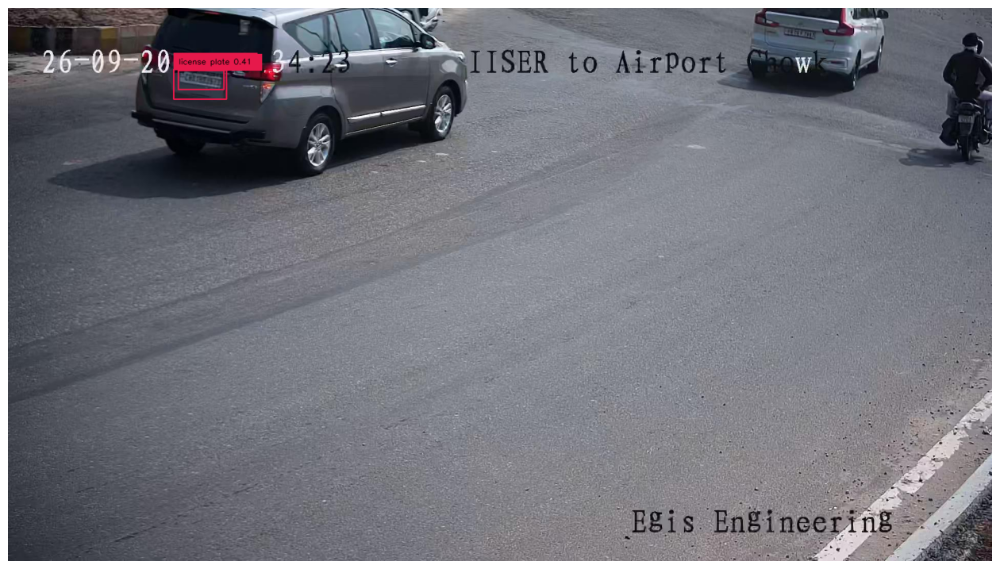

In [ ]:
from typing import List

def enhance_class_name(class_names: List[str]) -> List[str]:
   return [
       f"all {class_name}s"
       for class_name
       in class_names
   ]
import cv2
import supervision as sv

# load image
image = cv2.imread(SOURCE_IMAGE_PATH)

# detect objects
detections = grounding_dino_model.predict_with_classes(
   image=image,
   classes=enhance_class_name(class_names=CLASSES),
   box_threshold=BOX_TRESHOLD,
   text_threshold=TEXT_TRESHOLD
)

# annotate image with detections
box_annotator = svn.BoxAnnotator()
labels = [
   f"{CLASSES[class_id]} {confidence:0.2f}"
   for _, _, confidence, class_id, _
   in detections]
annotated_frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

%matplotlib inline
svn.plot_image(annotated_frame, (16, 16))

In [ ]:
import os

IMAGES_DIRECTORY = "./data"
IMAGES_EXTENSIONS = ['jpg', 'jpeg', 'png']

CLASSES = ['license plate']
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.15

In [ ]:
import cv2
from tqdm.notebook import tqdm

images = {}
annotations = {}

image_paths = svn.list_files_with_extensions(
   directory=IMAGES_DIRECTORY,
   extensions=IMAGES_EXTENSIONS)

for image_path in tqdm(image_paths):
   image_name = image_path.name
   image_path = str(image_path)
   image = cv2.imread(image_path)

   detections = grounding_dino_model.predict_with_classes(
       image=image,
       classes=enhance_class_name(class_names=CLASSES),
       box_threshold=BOX_TRESHOLD,
       text_threshold=TEXT_TRESHOLD
   )
   detections = detections[detections.class_id != None]
   images[image_name] = image
   annotations[image_name] = detections

  0%|          | 0/159 [00:00<?, ?it/s]

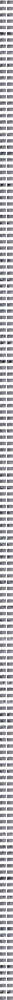

In [25]:
plot_images = []
plot_titles = []

box_annotator = svn.BoxAnnotator()
mask_annotator = svn.MaskAnnotator()

for image_name, detections in annotations.items():
   image = images[image_name]
   plot_images.append(image)
   plot_titles.append(image_name)

   labels = [
       f"{CLASSES[class_id]} {confidence:0.2f}"
       for _, _, confidence, class_id, _
       in detections]
   annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)
   annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections, labels=labels)
   plot_images.append(annotated_image)
   title = " ".join(set([
       CLASSES[class_id]
       for class_id
       in detections.class_id
   ]))
   plot_titles.append(title)

svn.plot_images_grid(
   images=plot_images,
   titles=plot_titles,
   grid_size=(len(annotations), 2),
   size=(2 * 4, len(annotations) * 4))

In [37]:
ANNOTATIONS_DIRECTORY = "/content/drive/MyDrive/annotations"
MIN_IMAGE_AREA_PERCENTAGE = 0.002
MAX_IMAGE_AREA_PERCENTAGE = 0.80
APPROXIMATION_PERCENTAGE = 0.75
svn.Dataset(
   classes=CLASSES,
   images=images,
   annotations=annotations
).as_pascal_voc(
   annotations_directory_path=ANNOTATIONS_DIRECTORY,
   min_image_area_percentage=MIN_IMAGE_AREA_PERCENTAGE,
   max_image_area_percentage=MAX_IMAGE_AREA_PERCENTAGE,
   approximation_percentage=APPROXIMATION_PERCENTAGE
)